<a href="https://colab.research.google.com/github/TriDuks/AIDeepLearning/blob/main/DetectYoLov5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies

%cd /content/yolov5

In [ ]:
!pip install utils

In [4]:
import torch
from IPython.display import Image  # for displaying images
from utils.downloads import attempt_download   # for downloading models/datasets
print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [ ]:
%cd /content/
!curl -L "https://app.roboflow.com/ds/Sm358Yy32x?key=tCsZohMaXi" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

In [13]:
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 6
names: ['0', '1', '2', '3', '4', '5']

roboflow:
  workspace: hcmute-cgrwq
  project: xla_money
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/hcmute-cgrwq/xla_money/dataset/1

In [14]:
import yaml
with open('data.yaml', 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

In [16]:
%%time
%cd /content/yolov5/
!python train.py --img 481 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/yolov5l.yaml --weights '' --name yolo5s_result --nosave --cache

/content/yolov5
train: weights=, cfg=./models/yolov5l.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=481, rect=False, resume=False, nosave=True, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolo5s_result, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

/content/yolov5/runs/train/yolo5s_result2


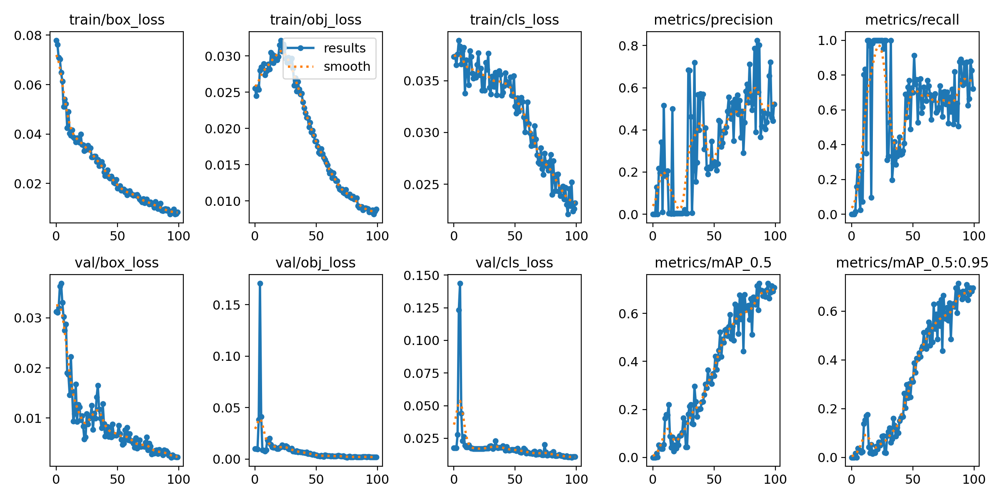

In [44]:
%cd /content/yolov5/runs/train/yolo5s_result2/
Image(filename='results.png', width = 1000)

Training Data: 


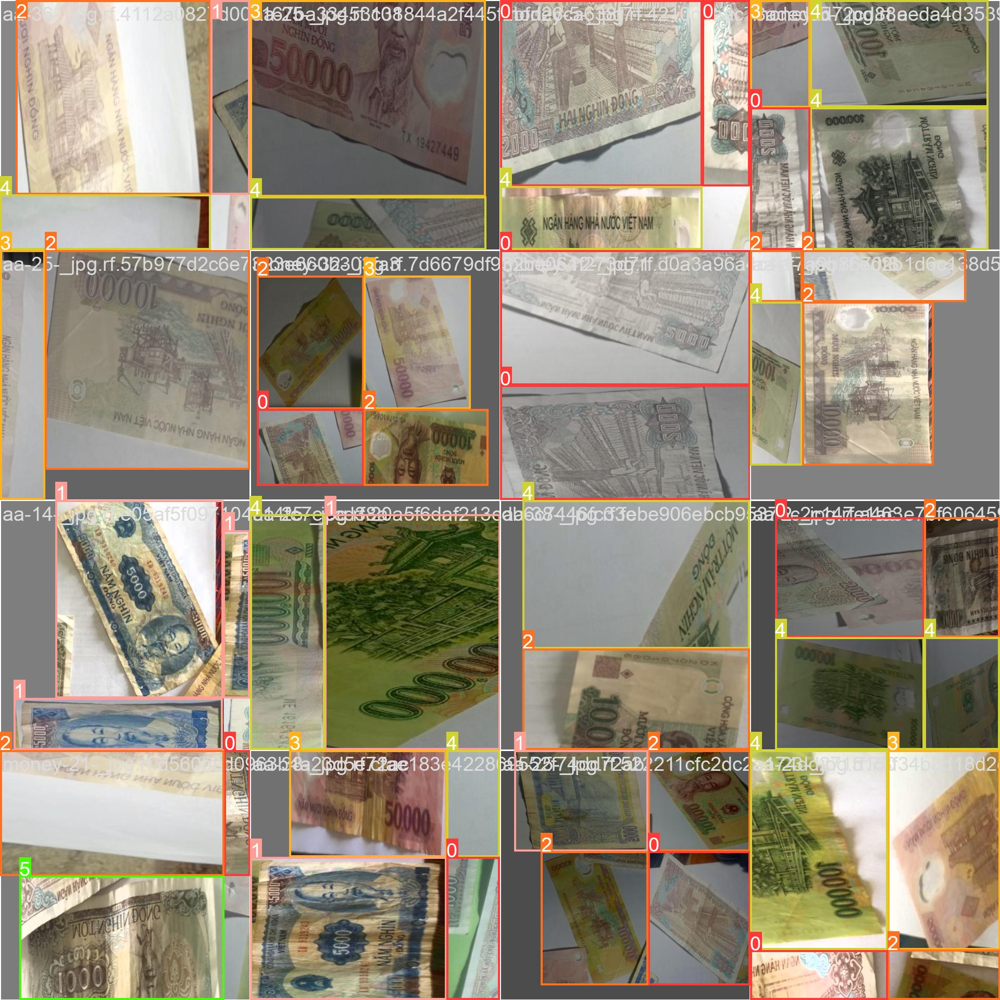

In [48]:
print('Training Data: ')
Image(filename = 'train_batch0.jpg', width = 600)

In [49]:
%ls weights

last.pt


In [65]:
%cd /content/yolov5/ 
!python detect.py --weights weights/last.pt --img 52 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['weights/last.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[52, 52], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5l summary: 267 layers, 46135203 parameters, 0 gradients, 107.7 GFLOPs
WARNING ⚠️ --img-size [52, 52] must be multiple of max stride 32, updating to [64, 64]
image 1/17 /content/test/images/aa-10-_jpg.rf.5430c538c65227cd450a00bd557716cc.jpg: 64x64 (no detections), 18.2ms
image 2/17 /content/test/images/aa-10-_jpg.rf.b03cfa7c31e13c92f942d741e20c63cf.jpg: 64x64 (no detections), 18.1ms
image 3/17 /content/test/images/aa

In [ ]:
!pip install display

In [ ]:
import glob
from IPython.display import Images, display
#for imageName in glob.glob('./

In [72]:
from google.colab import drive
drive.mount('/content/gdrive')

KeyboardInterrupt: ignored

In [ ]:
%cp /content/yolov5/weights/last.pt /content/gdrive/